# ECE1512-A3

# Ziqi Zhang - 1001374684

# Task 1

In [0]:
#import libraries
import numpy as np
import keras
from keras import backend as K
from keras.models import load_model
from keras.models import Sequential
from keras.layers import Activation
from keras.layers.core import Dense, Flatten
from keras.optimizers import Adam
from keras.metrics import categorical_crossentropy
from keras.preprocessing.image import ImageDataGenerator
from keras.layers.normalization import BatchNormalization
from keras.layers.convolutional import *
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure, imshow, axis
from matplotlib.image import imread
from sklearn.metrics import confusion_matrix
import itertools as itools
from sklearn.utils.multiclass import unique_labels
from IPython.display import Image

%matplotlib inline

In [0]:
#define image path
train_path = '/home/elton/Desktop/ECE1512/a3_release/data/train'
test_path = '/home/elton/Desktop/ECE1512/a3_release/data/test'
mask_path = '/home/elton/Desktop/ECE1512/a3_release/data/ground_truth'

In [0]:
#define batches
test_batches = ImageDataGenerator(rescale=1./255,
                                  shear_range=0.2,
                                  rotation_range=30,
                                  horizontal_flip=True,
                                  vertical_flip=True).flow_from_directory(test_path, 
                                                        target_size=(224,224), batch_size=10, shuffle=False)

Found 515 images belonging to 5 classes.


In [0]:
#load pre-trained model
model = load_model('/home/elton/Desktop/ECE1512/a3_release/save/texturenet.h5')

In [0]:
#Test with testing set
predictions = model.predict_generator(test_batches, steps=52, verbose=1)

52/52 [==============================] - 25s 477ms/step


## Overall classification accuracy on the test set

In [0]:
#Calculate loss and accuracy
loss, acc = model.evaluate(test_batches, steps=52, verbose=1)
print("loss: ",loss, "\naccuracy: ", acc)

52/52 [==============================] - 16s 312ms/step
loss:  1.2946882247924805 
accuracy:  0.9203883409500122


## Plot the classification ROC curves (and find the AUC) for each class

In [0]:
#import libraries
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

In [0]:
#filter prediciton result
for i in range(len(predictions)):
    for j in range(0,5):
        if predictions[i][j] >= 0.5:
            predictions[i][j] = 1
        else:
            predictions[i][j] = 0

In [0]:
#transfer test_batches.class array to list
tbc = test_batches.classes
tbc_t = np.zeros((len(tbc),5))
for i in range(len(tbc)):
    tbc_t[i][tbc[i]] = 1

In [0]:
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(5):
    fpr[i], tpr[i], _ = roc_curve(tbc_t[:, i], predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

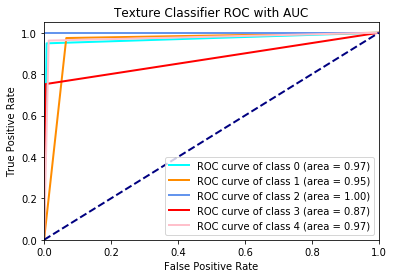

In [0]:
#plot ROC and AUC
colors = itools.cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'pink'])
for i, color in zip(range(0,5), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))
    
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Texture Classifier ROC with AUC')
plt.legend(loc="lower right")
plt.show()

## Plot the normalized confusion matrix

In [0]:
pred = np.argmax(predictions, axis=1)

In [0]:
#compute confusion matrix
np.set_printoptions(precision=2)
cm = confusion_matrix(test_batches.classes,pred)

In [0]:
#set parameters for plotting confusion matrix
def plot_confusion_matrix(cm, classes,
                          normalize=True,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    #plot elements
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    plt.ylim([4.5, -0.5])
    plt.xlabel('predicted')
    plt.ylabel('true')
    
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
        
    #print(cm)
    
    #text elements
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(j, i, format(cm[i, j], '.2f'),
                     ha="center",
                     color="white" if cm[i, j] > thresh else "black")
            
    plt.tight_layout()

Normalized confusion matrix


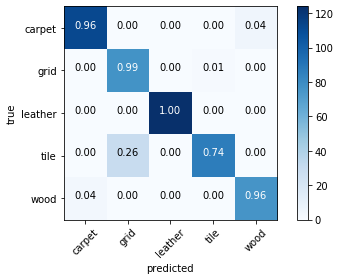

In [0]:
# Plot normalized confusion matrix
plot_confusion_matrix(cm, classes=['carpet','grid','leather','tile','wood'],
                      title='Confusion matrix, without normalization')

## Analyze the success cases and failure modes

In [0]:
#list the prediction errors
ima = []
ecode = []
rcode = []

for i in range(len(tbc)):
    if tbc[i] != pred[i]:
        ima.append('/home/elton/Desktop/ECE1512/a3_release/data/test/{0}'.format(test_batches.filenames[i]))
        ecode.append(pred[i])
        rcode.append(tbc[i])

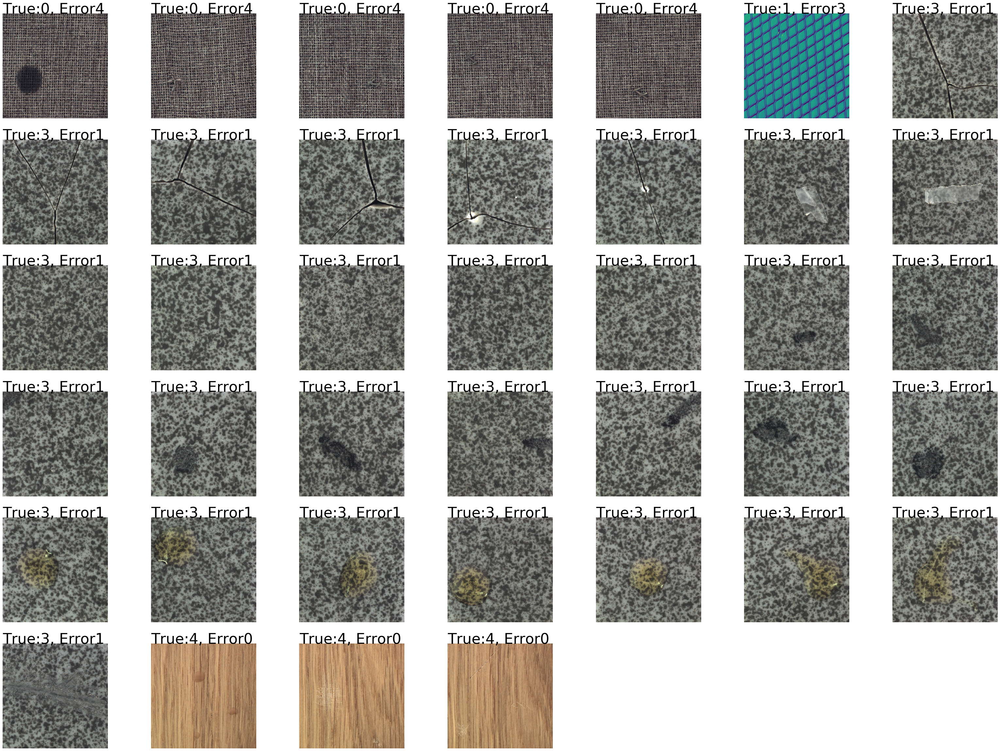

In [0]:
#show the images with the wrong predicitons
fig1 = figure(figsize = (50,50),dpi=80)
number_of_files = len(ima)
for i in range(number_of_files):
    ax = fig1.add_subplot(8,number_of_files/5,i+1)
    image = imread(ima[i])
    imshow(image)
    ax.text(0.5, 0.5, "True:{0}, Error{1}".format(rcode[i],ecode[i]),fontsize=40)
    axis('off')

From the summary of the mis-classified cases, it is shown that all class 2 (leather) images are correctly classified. Mis-classification present in all other classes except class 2. Among them, class 3 (tile) has the most mis-classified cases. This phenomenon can be explained by the texture of each class. Among all the textures, only class 2 (leather) is "smooth". Other classes all contain complex patterns, which can be mis-leading to the neural network. The effect of complex patterns is also proved by the fact that among all the mis-classified cases, none of them is classified as class 2 (leather).

The textures of class 0, 1, and 4 are all realtively well-patterned, while the texture of class 3 (tile) is quite random. It proves that strong randomness of the texture pattern also contributes to the mis-classification.

Among all the mis-classified images, a large portion of them are defected cases. Since the neural network is trained on non-defective images, the noises from the defections could also contribute to the mis-classification.


# Task 2

In [0]:
import sys
sys.path.insert(0,'/home/elton/Desktop/ECE1512/a3_release/')

In [0]:
import math
from keras.models import load_model
from keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

from gradcam_utils import *

In [0]:
DATASET_ROOT = '/home/elton/Desktop/ECE1512/a3_release/data/test'
GT_ROOT = '/home/elton/Desktop/ECE1512/a3_release/data/ground_truth'
CLASSES = ['carpet', 'grid', 'leather', 'tile', 'wood']

test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(DATASET_ROOT,
                                                    class_mode='categorical',
                                                    interpolation='bilinear',
                                                    target_size=(224, 224),
                                                    batch_size=10,
                                                    shuffle=False,
                                                    classes=CLASSES)
unique, counts = np.unique(test_generator.labels, return_counts=True)
print(dict(zip(CLASSES, counts)))

Found 515 images belonging to 5 classes.
{'carpet': 117, 'grid': 78, 'leather': 124, 'tile': 117, 'wood': 79}


In [0]:
model = load_model('/home/elton/Desktop/ECE1512/a3_release/save/texturenet.h5')

In [0]:
pred_scores = model.predict_generator(test_generator,verbose=1)

52/52 [==============================] - 25s 488ms/step


In [0]:
alpha, layer = get_grad_cam_weights(model, np.zeros((1, 224, 224, 3)))

### std method

In [0]:
#Classify each test image into defected or not
start_idxa = [0, 100, 200, 300, 400]
end_idxa = [99, 199, 299, 399, 514]
def_pred_all = []

test_generator.reset()

for l in range(len(start_idxa)):
    #define image batches
    start_idx = start_idxa[l]
    end_idx = end_idxa[l]
    cur_batch_sz = end_idx - start_idx + 1
    
    if start_idx < 400:
        img_trans = np.zeros((100,224,224))
        for i in range(0,10):
            if i == 0:
                img_batch = next(test_generator)[0]
            else:
                img_batch = np.concatenate((img_batch,next(test_generator)[0]))
    else:
        img_trans = np.zeros((115,224,224))
        for i in range(0,12):
            if i == 0:
                img_batch = next(test_generator)[0]
            else:
                img_batch = np.concatenate((img_batch,next(test_generator)[0]))
    
    #threshold classification result from probability to 0, 1
    is_pass_threshold = np.zeros((515, len(CLASSES)))
    is_pass_threshold[np.arange(515), np.argmax(pred_scores, axis=1)] = 1

    ipt1 = np.zeros((cur_batch_sz, len(CLASSES)))
    for i in range(0,cur_batch_sz):
        ipt1[i] = is_pass_threshold[i + start_idx]
    ipt2 = np.argmax(ipt1, axis=1)
    
    #calculate grad_cam
    X = grad_cam(model, alpha, img_batch[:, :, :, :], 
             ipt1, layer, pred_scores, 
             orig_sz=img_batch.shape[1:3], should_upsample=True)
    
    #Calculate mean and std of each activation map
    mean = []
    std = []

    for i in range(0,cur_batch_sz):
        mean.append(np.mean(X[i, :, :, ipt2[i]]))
        std.append(np.std(X[i, :, :, ipt2[i]]))

    #Classify each image based on std
    def_pred = []
    for i in range(0,cur_batch_sz):      #apply threshold
        for j in range (10,214):
            for k in range (10,214):
                if X[i, j, k, ipt2[i]] < mean[i] - 2.0 * std[i]:
                    img_trans[i,j,k] = 1
    
    for i in range(0,cur_batch_sz):     #search for defection area
        abn = 0
        for a in range(15,209):
            if abn == 1:
                break
            for b in range(15,209):
                sum1 = 0
                for c in range(a-5,a+5):
                    for d in range(b-5,b+5):
                        if img_trans[i,c,d] == 1:
                            sum1 = sum1 + 1
                if sum1 >= 50:
                    abn = 1
                    break
        if abn == 1:
            def_pred.append(1)
        else:
            def_pred.append(0)
        #print("batch: {0}, image: {1}, result: {2}".format(l, i, abn))   
    def_pred_all.append(def_pred)
    
def_pred_all = np.concatenate(def_pred_all).ravel()

In [0]:
#obtain true result
true_defect = []
for i in range (0,len(test_generator.filenames)):
    if 'good' in test_generator.filenames[i]:
        true_defect.append(0)
    else:
        true_defect.append(1)
        
true_defect = np.array(true_defect)

In [0]:
#seperate labels and predictions into classes
tdf = dict()
pdf = dict()
list1 = []
list2 = []
start = [0, 117, 195, 319, 436]
end = [117, 195, 319, 436, 515]

for j in range(0,5):
    for i in range(start[j],end[j]):
        list1.append(true_defect[i])
        list2.append(def_pred_all[i])
    tdf[j] = list1
    pdf[j] = list2
    list1 = []
    list2 = []

In [0]:
#calculate ROC and AUC
fpr = dict()
tpr = dict()
roc_auc = dict()
c = [117, 78, 124, 117, 79]

for i in range(5):
    fpr[i], tpr[i], _ = roc_curve(tdf[i], pdf[i])
    roc_auc[i] = auc(fpr[i], tpr[i])

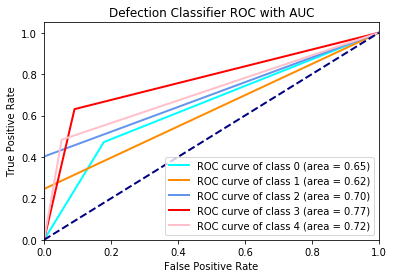

In [0]:
#plot ROC and AUC
colors = itools.cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'pink'])
for i, color in zip(range(0,5), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))
    
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Defection Classifier ROC with AUC')
plt.legend(loc="lower right")
plt.show()

In [0]:
#calculate accuracy
count = 0
for i in range(0,len(test_generator.filenames)):
    if def_pred_all[i] == true_defect[i]:
        count =count + 1
accuracy = count / len(test_generator.filenames)
print("accuracy: ", accuracy)

accuracy:  0.5805825242718446


## Task 3

In [0]:
#import ground truth mask
test_path = '/home/elton/Desktop/ECE1512/a3_release/data/test'
mask_path = '/home/elton/Desktop/ECE1512/a3_release/data/ground_truth'

test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(test_path,
                                                    class_mode='categorical',
                                                    interpolation='bilinear',
                                                    target_size=(224, 224),
                                                    batch_size=1,
                                                    shuffle=False,
                                                    classes=CLASSES)
mask_datagen = ImageDataGenerator(rescale=1./255)
mask_generator = test_datagen.flow_from_directory(mask_path,
                                                    class_mode='categorical',
                                                    interpolation='bilinear',
                                                    target_size=(224, 224),
                                                    batch_size=10,
                                                    shuffle=False,
                                                    classes=CLASSES)


Found 515 images belonging to 5 classes.
Found 382 images belonging to 5 classes.


In [0]:
#obtain masks as img_mask
mask_generator.reset()
for i in range(0,515):
    if i == 0:
        img_mask = next(mask_generator)[0]
    else:
        img_mask = np.concatenate((img_mask,next(mask_generator)[0]))
for i,j,k in range(382,224,224):
    if img_mask[i,j,k] > 0.5:
        img_mask[i,j,k] = 1
    else:
        img_mask[i,j,k] = 0

In [0]:
#obtain test image as img_test
test_generator.reset()
pred_scores_new = np.zeros((382, 5))
j = 0

for i in range(0,515):
    if 'good' not in test_generator.filenames[i]:
        pred_scores_new[j, :] = pred_scores[i]
        j += 1
        if i == 0:
            img_test = next(test_generator)[0]
        else:
            img_test = np.concatenate((img_test,next(test_generator)[0]))
    else:
        next(test_generator)[0]
        
pred_scores_new = np.array(pred_scores_new)

In [0]:
pred_new = np.zeros((2, 191, 5))
for i in range(191):
    pred_new[0, :, :] = pred_scores_new[i]
    pred_new[1, :, :] = pred_scores_new[i + 191]

In [0]:
#caculate gradcam and apply threshold
cur_batch_sz = 191
start_index = [0, 191]
def_trans = np.zeros((382, 224, 224))

is_pass_threshold = np.zeros((382, 5))
is_pass_threshold[np.arange(382), np.argmax(pred_scores_new, axis=1)] = 1

for l in range(2):
    ipt1 = np.zeros((cur_batch_sz, len(CLASSES)))
    for i in range(0,cur_batch_sz):
        ipt1[i] = is_pass_threshold[i + start_index[l]]
    ipt2 = np.argmax(ipt1, axis=1)

    #calculate grad_cam
    Y = grad_cam(model, alpha, img_test[start_index[l]:start_index[l] + cur_batch_sz, :, :, :], 
             ipt1, layer, pred_new[l], 
             orig_sz=img_test.shape[1:3], should_upsample=True)

    #Calculate mean and std of each activation map
    mean = []
    std = []

    for i in range(0,cur_batch_sz):
        mean.append(np.mean(Y[i, :, :, ipt2[i]]))
        std.append(np.std(Y[i, :, :, ipt2[i]]))

    #apply threshold
    for i in range(0,cur_batch_sz):
        for j in range (10,214):
            for k in range (10,214):
                if Y[i, j, k, ipt2[i]] < mean[i] - 2.0 * std[i]:
                    def_trans[i + start_index[l],j,k] = 1

In [0]:
img_mask[0][120]

array([[0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.

In [0]:
#calculate IoU
I = np.zeros(382)
U = np.zeros(382)
for i in range(382):
    for j, k in range(224,224):
        if (def_trans[j,k] == 1) and (img_mask[j,k] == 1):
            I[i] += 1
        if (def_trans[j,k] == 1) or (img_mask[j,k] == 1):
            U[i] += 1
#mIoU = np.average(I)/np.average(U)
#mIoU
U

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

([], <a list of 0 Text yticklabel objects>)

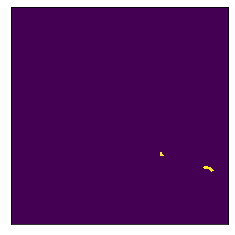

In [0]:
plt.figure()
plt.imshow(def_trans[194, :, :])
plt.xticks([])
plt.yticks([])

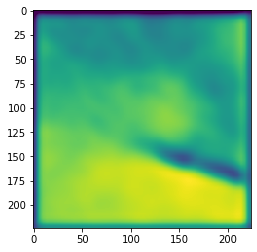

In [0]:
plt.imshow(Y[3,:,:,2])

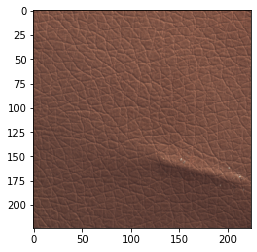

In [0]:
plt.imshow(img_test[194])